# Qualitative Caption Comparison

This notebook just loads the weights of the six pretrained models and compares them on the same 6 images downloaded from the internet. These images were not part of the Flickr30k dataset.

In [1]:
import os
import torch
import torch.nn as nn
from PIL import Image
from transformers import AutoTokenizer
import sys
import gc
import warnings
warnings.filterwarnings("ignore")
from transformers import AutoTokenizer, AutoModel

"""
Add support for either running in collab by uploading this notebook and
mounting the directory or locally from the room or experiments folder"
"""
IN_COLAB = 'google.colab' in sys.modules

if IN_COLAB:
    from google.colab import drive
    drive.mount('/content/drive')

    # NOTE: change the drive path if running with a mounted google drive in collab
    project_root = "/content/drive/Othercomputers/My MacBook Pro/image-captioning"
else:
    cwd = os.getcwd()

    if cwd.endswith("experiments"):
        project_root = os.path.abspath(os.path.join(cwd, '..'))
    else:
        project_root = cwd

if project_root not in sys.path:
    sys.path.append(project_root)

print("Project root:", project_root)

from vision_language_model import VisionLanguageModel
import evaluation as eval


device = torch.device("cuda" if torch.cuda.is_available() else
                      "mps" if torch.backends.mps.is_available() else "cpu")


image_dir = os.path.join(project_root, "experiments/evaluation_images")

image_paths = sorted([
    os.path.join(image_dir, fname)
    for fname in os.listdir(image_dir)
    if fname.lower().endswith((".jpg", ".jpeg", ".png"))
])

images = [Image.open(p).convert("RGB") for p in image_paths]
model_weights_dir = os.path.join(project_root, "model_weights")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Project root: /content/drive/Othercomputers/My MacBook Pro/image-captioning


# Experiment 1: ViT/GPT2

In [2]:
tokenizer = AutoTokenizer.from_pretrained("gpt2")
tokenizer.pad_token = tokenizer.eos_token

# model config for stage one
model = VisionLanguageModel(
    image_encoder_type="vit",
    llava_projections=True,
    cross_attention=False,
    debug=False,
    decoder_type="gpt2",
    d_model=768,
    tokenizer=tokenizer
    ).to(device)

model_path=os.path.join(model_weights_dir, "experiment_1_finetune_weights_2025-04-13_23-08-39.pt")
state_dict = torch.load(model_path, map_location=device)
model.load_state_dict(state_dict)

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


Initializing GPT-2 model...


<All keys matched successfully>

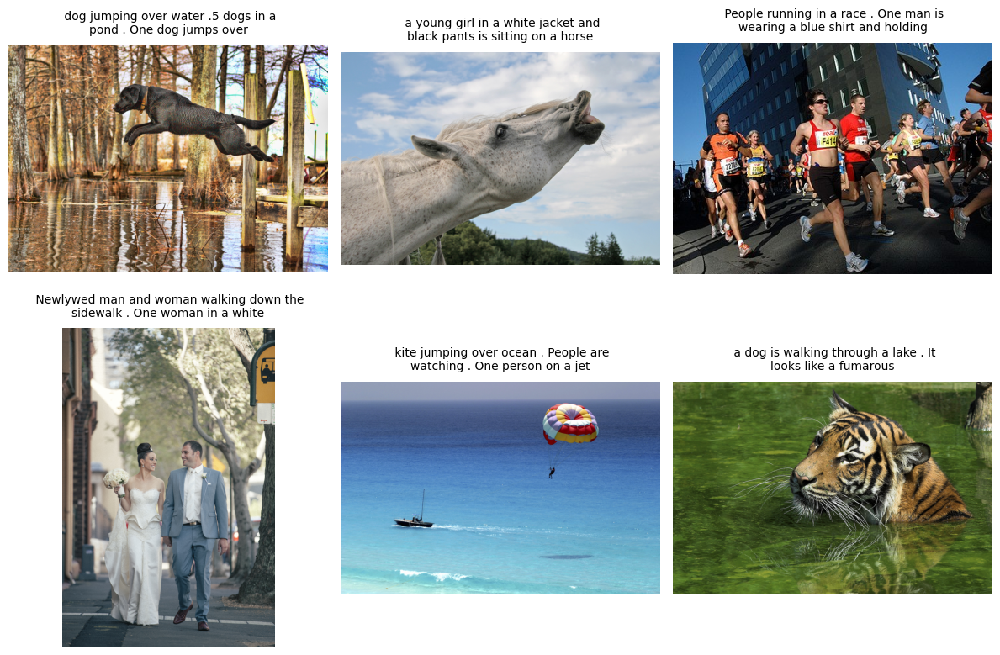

In [3]:
decoded_preds = model.predict(images, max_new_tokens=15, n_beams=2)
image_pred_pairs = []

for prediction, image in zip(decoded_preds, images):
      image_pred_pairs.append((image, prediction))

eval.display_predicted_captions_grid(image_pred_pairs)

In [4]:
model.to("cpu")
del model
del tokenizer
torch.cuda.empty_cache()
gc.collect()
torch.cuda.ipc_collect()

# Experiment 2: ViT/Vicuna 7b

In [5]:
tokenizer = AutoTokenizer.from_pretrained("lmsys/vicuna-7b-v1.5")
tokenizer.pad_token = tokenizer.eos_token

# model config for stage one
model = VisionLanguageModel(
    image_encoder_type="vit",
    llava_projections=True,
    cross_attention=False,
    debug=False,
    decoder_type="vicuna",
    d_model=4096,
    tokenizer=tokenizer
    ).to("cpu")

model.decoder.add_lora()

loss_fn = nn.CrossEntropyLoss(ignore_index=tokenizer.pad_token_id)

model_path=os.path.join(model_weights_dir, "experiment_2_finetune_weights_2025-04-14_12-02-48.pt")
state_dict = torch.load(model_path, map_location="cpu")
model.load_state_dict(state_dict)
model.to(device);

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


Initializing Vicuna model...


Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

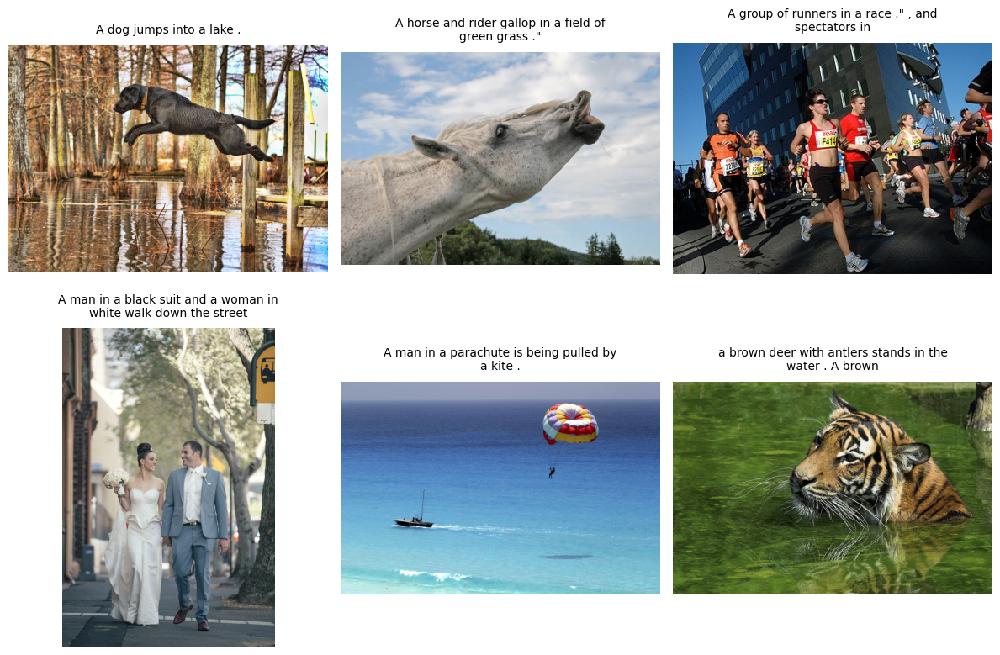

In [6]:
decoded_preds = model.predict(images, max_new_tokens=15, n_beams=2)
image_pred_pairs = []

for prediction, image in zip(decoded_preds, images):
      image_pred_pairs.append((image, prediction))

eval.display_predicted_captions_grid(image_pred_pairs)

In [7]:
model.to("cpu")
del model
del tokenizer
torch.cuda.empty_cache()
gc.collect()
torch.cuda.ipc_collect()

# Experiment 3: Clip/GPT2

In [8]:
tokenizer = AutoTokenizer.from_pretrained("gpt2")
tokenizer.pad_token = tokenizer.eos_token

# model config for stage one
model = VisionLanguageModel(
    image_encoder_type="clip",
    llava_projections=True,
    cross_attention=False,
    debug=False,
    decoder_type="gpt2",
    d_model=768,
    tokenizer=tokenizer
    ).to(device)

loss_fn = nn.CrossEntropyLoss(ignore_index=tokenizer.pad_token_id)

model_path=os.path.join(model_weights_dir, "experiment_3_finetune_weights_2025-04-13_21-07-29.pt")
state_dict = torch.load(model_path, map_location=device)
model.load_state_dict(state_dict)

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


Initializing GPT-2 model...


<All keys matched successfully>

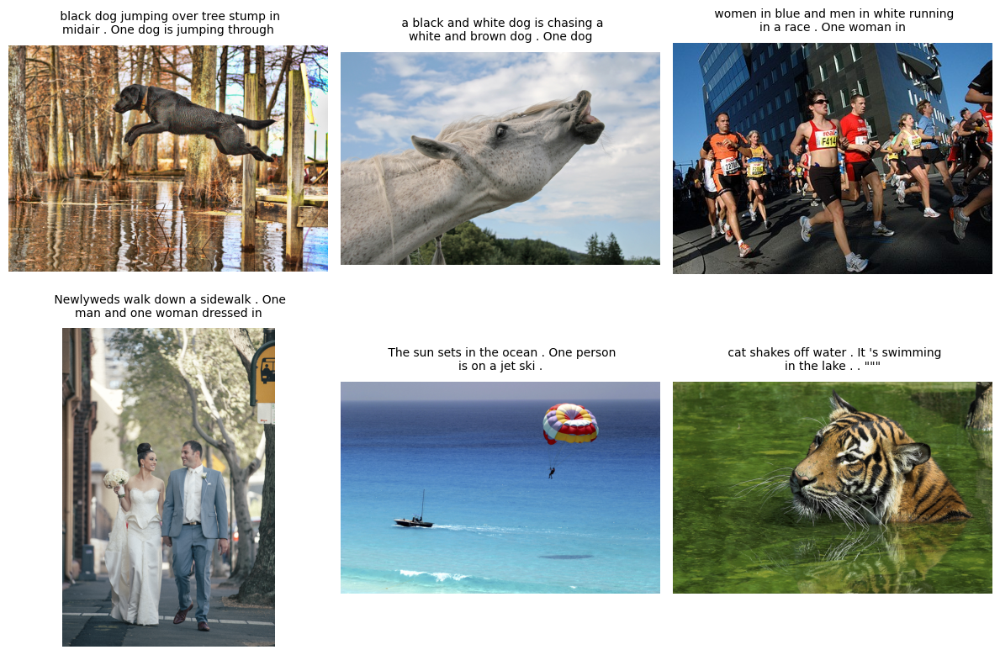

In [9]:
decoded_preds = model.predict(images, max_new_tokens=15, n_beams=2)
image_pred_pairs = []

for prediction, image in zip(decoded_preds, images):
      image_pred_pairs.append((image, prediction))

eval.display_predicted_captions_grid(image_pred_pairs)

In [10]:
del model
torch.cuda.empty_cache()
gc.collect()
torch.cuda.ipc_collect()

# Experiment 4: Clip/Vicuna 7b

In [11]:
tokenizer = AutoTokenizer.from_pretrained("lmsys/vicuna-7b-v1.5")
tokenizer.pad_token = tokenizer.eos_token

# model config for stage one
model = VisionLanguageModel(
    image_encoder_type="clip",
    llava_projections=True,
    cross_attention=False,
    debug=False,
    decoder_type="vicuna",
    d_model=4096,
    tokenizer=tokenizer
    ).to("cpu")

loss_fn = nn.CrossEntropyLoss(ignore_index=tokenizer.pad_token_id)

model.decoder.add_lora()

model_path=os.path.join(model_weights_dir, "experiment_4_finetune_weights_2025-04-14_14-56-03.pt")
state_dict = torch.load(model_path, map_location="cpu")
model.load_state_dict(state_dict)
model.to(device);

Initializing Vicuna model...


Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

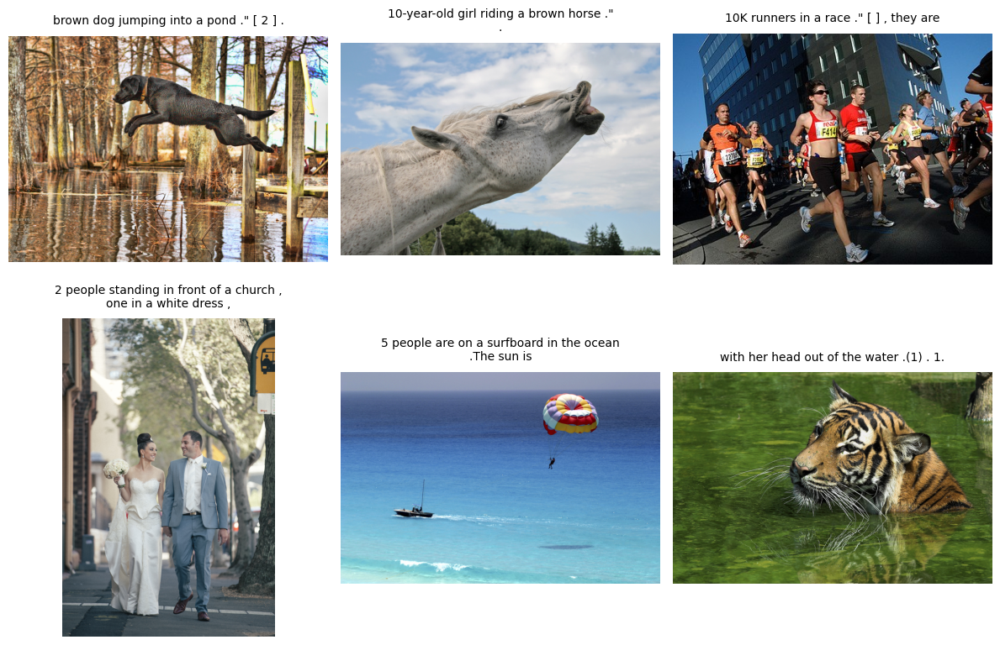

In [12]:
decoded_preds = model.predict(images, max_new_tokens=15, n_beams=2)
image_pred_pairs = []

for prediction, image in zip(decoded_preds, images):
      image_pred_pairs.append((image, prediction))

eval.display_predicted_captions_grid(image_pred_pairs)

In [13]:
model.to("cpu")
del model
del tokenizer
torch.cuda.empty_cache()
gc.collect()
torch.cuda.ipc_collect()

# Experiment 5: Clip/Vicuna 7b (mlp pretaining stage only)

In [14]:
tokenizer = AutoTokenizer.from_pretrained("lmsys/vicuna-7b-v1.5")
tokenizer.pad_token = tokenizer.eos_token

# model config for stage one
model = VisionLanguageModel(
    image_encoder_type="clip",
    llava_projections=True,
    cross_attention=False,
    debug=False,
    decoder_type="vicuna",
    d_model=4096,
    tokenizer=tokenizer
    )

loss_fn = nn.CrossEntropyLoss(ignore_index=tokenizer.pad_token_id)

path=os.path.join(model_weights_dir, "experiment_5_pretrain_weights_2025-04-15_09-48-49.pt")
model.image_encoder.projection.load_state_dict(torch.load(path, map_location=device))
model.to(device);

Initializing Vicuna model...


Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

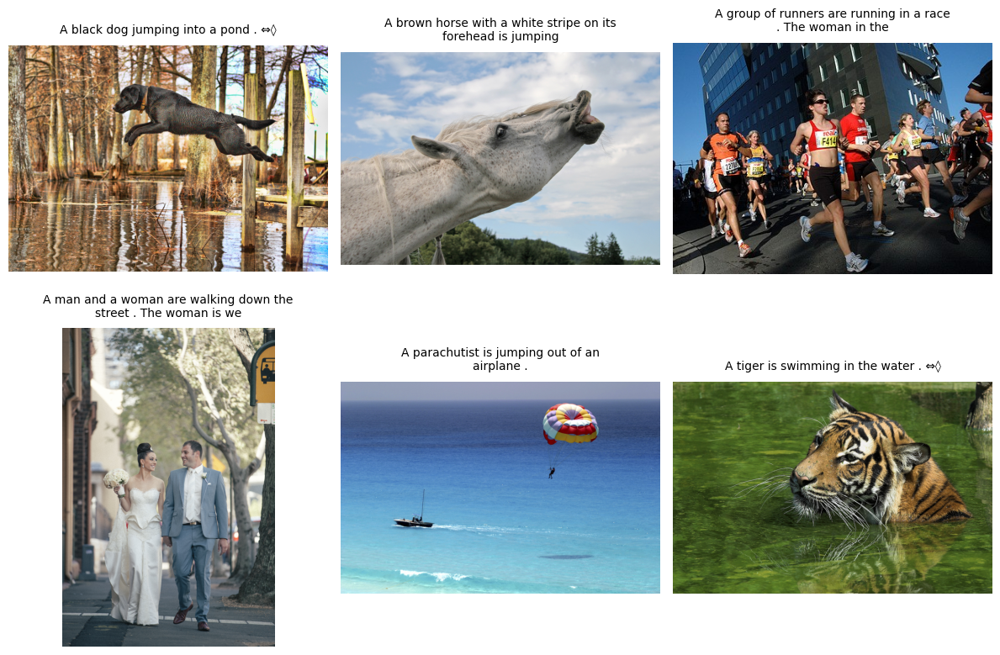

In [15]:
decoded_preds = model.predict(images, max_new_tokens=15, n_beams=2)
image_pred_pairs = []

for prediction, image in zip(decoded_preds, images):
      image_pred_pairs.append((image, prediction))

eval.display_predicted_captions_grid(image_pred_pairs)

In [16]:
model.to("cpu")
del model
del tokenizer
torch.cuda.empty_cache()
gc.collect()
torch.cuda.ipc_collect()

# Experiment 6: ViT/Vicuna 7b (mlp pretaining stage only)

In [17]:
tokenizer = AutoTokenizer.from_pretrained("lmsys/vicuna-7b-v1.5")
tokenizer.pad_token = tokenizer.eos_token

# model config for stage one
model = VisionLanguageModel(
    image_encoder_type="vit",
    llava_projections=True,
    cross_attention=False,
    debug=False,
    decoder_type="vicuna",
    d_model=4096,
    tokenizer=tokenizer
    )

loss_fn = nn.CrossEntropyLoss(ignore_index=tokenizer.pad_token_id)

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


Initializing Vicuna model...


Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

In [18]:
path=os.path.join(model_weights_dir, "experiment_6_pretrain_weights_2025-04-15_16-00-06.pt")
model.image_encoder.projection.load_state_dict(torch.load(path, map_location=device))
model.to(device);

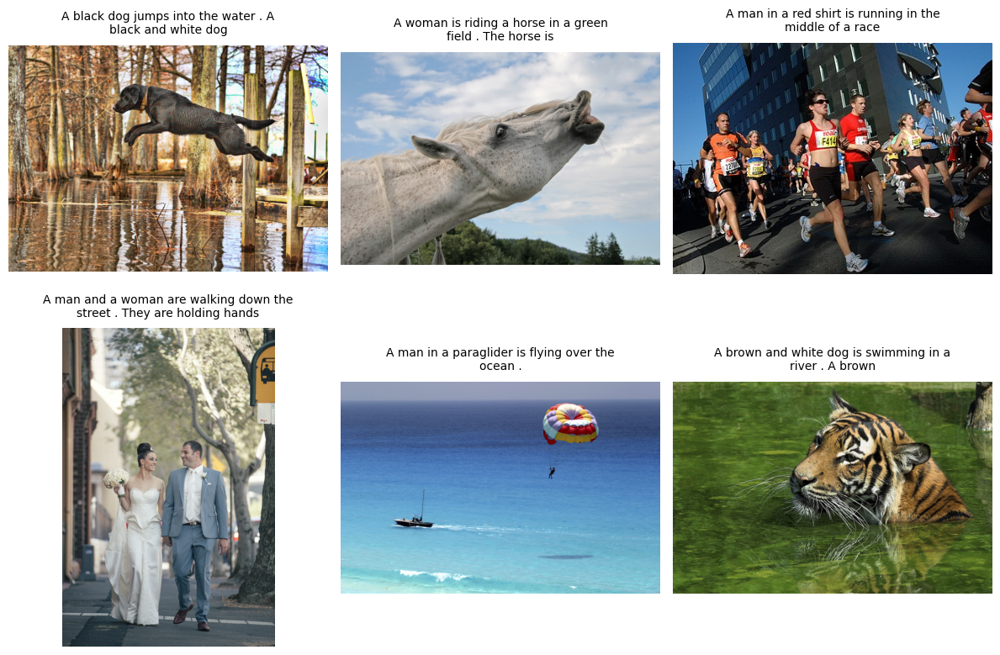

In [19]:
decoded_preds = model.predict(images, max_new_tokens=15, n_beams=2)
image_pred_pairs = []

for prediction, image in zip(decoded_preds, images):
      image_pred_pairs.append((image, prediction))

eval.display_predicted_captions_grid(image_pred_pairs)

In [20]:
del model
torch.cuda.empty_cache()
gc.collect()

13472